## Machine Learning applied College Admission Dataset

In [1]:
# Importing and installing libraries 
# %pip install seaborn
# %pip install scikit-learn 
# %pip install torch scikit-learn seaborn pandas openpyxl
# %pip install shap
# %pip install lime
# %pip install numpy
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, root_mean_squared_error
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR  
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingRegressor
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt
import shap
from sklearn.inspection import permutation_importance
from lime import lime_tabular
import random

C:\Users\iulia\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Importing, displaying the dataset and creating the feature set

In [2]:
# Importing the CSV file
df = pd.read_csv('Admission_Predict_Ver1.1.csv')
df = df.drop(df.columns[0], axis=1)
print(df)

# Checking for missing values
df.isnull().values.any()

# Selecting features using the column names
X = df[['GRE Score', 'TOEFL Score', 'University Rating', 'SOP', 'LOR', 'CGPA', 'Research']]

# Selecting the target variable using the column name
y = df['Chance of Admit']

# Displaying a table with statistics about the dataset
df.describe().transpose()

     GRE Score  TOEFL Score  University Rating  SOP  LOR  CGPA  Research  \
0          337          118                  4  4.5  4.5  9.65         1   
1          324          107                  4  4.0  4.5  8.87         1   
2          316          104                  3  3.0  3.5  8.00         1   
3          322          110                  3  3.5  2.5  8.67         1   
4          314          103                  2  2.0  3.0  8.21         0   
..         ...          ...                ...  ...  ...   ...       ...   
495        332          108                  5  4.5  4.0  9.02         1   
496        337          117                  5  5.0  5.0  9.87         1   
497        330          120                  5  4.5  5.0  9.56         1   
498        312          103                  4  4.0  5.0  8.43         0   
499        327          113                  4  4.5  4.5  9.04         0   

     Chance of Admit  
0               0.92  
1               0.76  
2               0.

,count,mean,std,min,25%,50%,75%,max
GRE Score,500.0,316.47200,11.295148,290.00,308.0000,317.00,325.00,340.00
TOEFL Score,500.0,107.19200,6.081868,92.00,103.0000,107.00,112.00,120.00
University Rating,500.0,3.11400,1.143512,1.00,2.0000,3.00,4.00,5.00
SOP,500.0,3.37400,0.991004,1.00,2.5000,3.50,4.00,5.00
LOR,500.0,3.48400,0.925450,1.00,3.0000,3.50,4.00,5.00
CGPA,500.0,8.57644,0.604813,6.80,8.1275,8.56,9.04,9.92
Research,500.0,0.56000,0.496884,0.00,0.0000,1.00,1.00,1.00
Chance of Admit,500.0,0.72174,0.141140,0.34,0.6300,0.72,0.82,0.97


<Axes: >

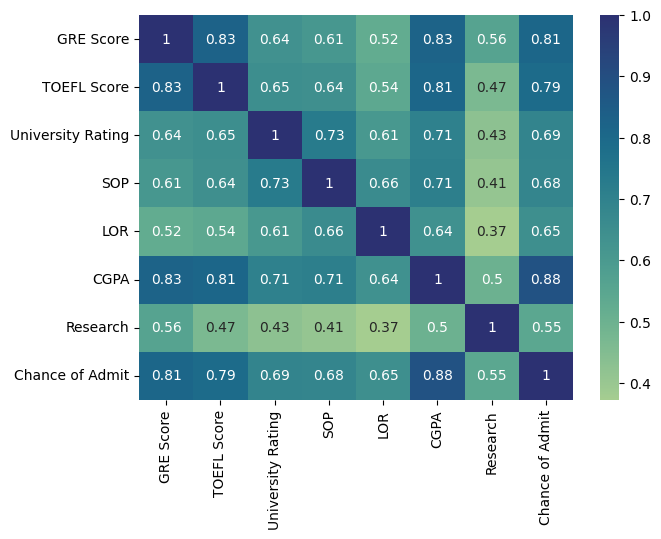

In [3]:
# Displaying the correlation matrix of the features 
plt.figure(figsize = (7,5))
sns.heatmap(df.corr(),annot=True, cmap="crest")

Splitting the dataset into training and testing sets

In [4]:
# Splitting the data into training and testing sets of 80:20
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=48)


Standardizing the features

In [5]:
# Standardizing the feature values
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

X_test_scaled = scaler.transform(X_test)

Training a Support Vector Regressor

In [6]:
# Setting a seed of 42 for reproducibility
np.random.seed(42)
random.seed(42)

# Setting up the parameter grid for hyperparameter tuning
svm_param_grid = {
    'C': [0.1, 1, 10],  # Regularization parameter
    'kernel': ['rbf', 'poly'],  # Types of kernels
    'gamma': ['scale', 'auto', 0.1],  # Kernel coefficient
    'epsilon': [0.01, 0.1, 0.2, 0.5],  # Epsilon in the epsilon-SVR model
    'degree': [2, 3, 4, 6],  
    'coef0': [0, 0.5, 1]
}

# Creating a Support Vector Regressor model 
svm = SVR()

# Setting up the grid search with cross-validation
svm_grid_search = GridSearchCV(estimator=svm, param_grid=svm_param_grid, cv=5, n_jobs=-1, scoring='neg_mean_squared_error')

# Fitting the grid search to the data
svm_grid_search.fit(X_train_scaled, y_train)

# Printing the best hyperparameters from grid search
svm_best_params = svm_grid_search.best_params_
print(svm_best_params)

# Fitting the best SVM model to the data
svm_best_model = svm_grid_search.best_estimator_

# Making predictions on the test set
svm_y_pred = svm_best_model.predict(X_test_scaled)

# Evaluating the model using the RMSE, MAE, MSE, R^2
svm_rmse = root_mean_squared_error(y_test, svm_y_pred)
svm_mae = mean_absolute_error(y_test, svm_y_pred)
svm_mse = mean_squared_error(y_test, svm_y_pred)
svm_r2 = r2_score(y_test, svm_y_pred)

# Printing the MSE, RMSE, MAE, and R^2 scores
print(f"Mean Squared Error: {svm_mse}")
print(f"Root Mean Squared Error: {svm_rmse}")
print(f"Mean Absolute Error: {svm_mae}")
print(f"R^2 Score: {svm_r2}")


{'C': 0.1, 'coef0': 0.5, 'degree': 2, 'epsilon': 0.01, 'gamma': 0.1, 'kernel': 'poly'}
Mean Squared Error: 0.003080922686381666
Root Mean Squared Error: 0.0555060599068396
Mean Absolute Error: 0.039628587063659335
R^2 Score: 0.8616839299099435


Training the Linear Regression model

In [7]:
# Creating a random seed for reproducibility
np.random.seed(42)
random.seed(42)

# Initializing the Linear Regression model
lr = LinearRegression()

# Fitting the Linear Regression on the data
lr.fit(X_train_scaled, y_train)

# Making predictions on the test data
y_pred_lr = lr.predict(X_test_scaled)

# Evaluating the model prediction using MSE, RMSE, MAE, and R^2
mse_lr = mean_squared_error(y_test, y_pred_lr)
rmse_lr = root_mean_squared_error(y_test, y_pred_lr)
mae_lr = mean_absolute_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)

# Printing the performance evaluation metrics 
print("Testing Performance:")
print(f"Mean Squared Error: {mse_lr}")
print(f"Root Mean Squared Error: {rmse_lr}")
print(f"Mean Absolute Error: {mae_lr}")
print(f"R^2 Score: {r2_lr}")



Testing Performance:
Mean Squared Error: 0.0031955101119318747
Root Mean Squared Error: 0.05652884318586287
Mean Absolute Error: 0.04203776569862496
R^2 Score: 0.8565396001109845


Checking the alpha values for Ridge Regression

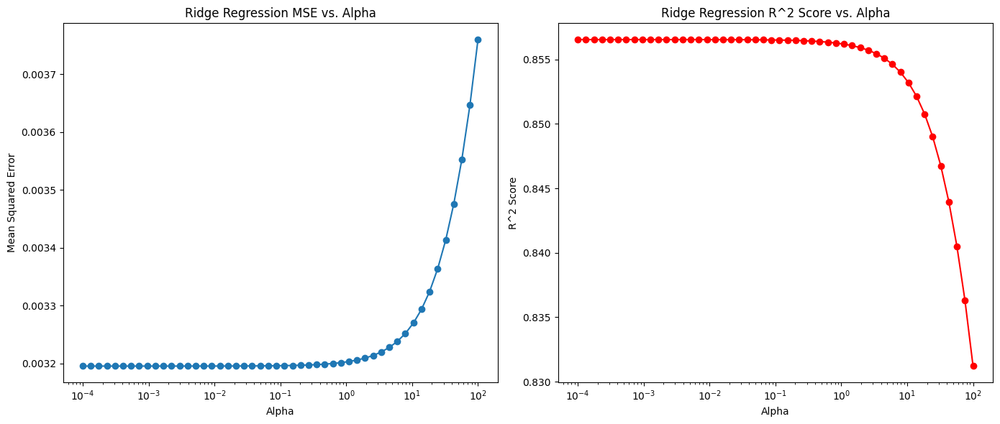

In [8]:
# Creating a random seed for reproducibility
np.random.seed(42)
random.seed(42)

# Initializing the alpha values to test
alpha_values = np.logspace(-4, 2, 50)  

# Initializing empty lists to store future MSE and R2 Scores
mse_values = []
r2_values = []

# Iterating through the alpha values
for alpha in alpha_values:
    # Initialing the Ridge Regression model with the current alpha value
    ridge_reg = Ridge(alpha=alpha)
    
    # Fitting the model
    ridge_reg.fit(X_train_scaled, y_train)
    
    # Making predictions on the test set
    y_pred_r = ridge_reg.predict(X_test_scaled)
    
    # Calculating and storing MSE and R^2 scores
    mse_values.append(mean_squared_error(y_test, y_pred_r))
    r2_values.append(r2_score(y_test, y_pred_r))

plt.figure(figsize=(14, 6))

# Plotting Mean Squared Error
plt.subplot(1, 2, 1)
plt.plot(alpha_values, mse_values, marker='o')
plt.xscale('log')
plt.xlabel('Alpha')
plt.ylabel('Mean Squared Error')
plt.title('Ridge Regression MSE vs. Alpha')

# Plotting R^2 Score
plt.subplot(1, 2, 2)
plt.plot(alpha_values, r2_values, marker='o', color='r')
plt.xscale('log')
plt.xlabel('Alpha')
plt.ylabel('R^2 Score')
plt.title('Ridge Regression R^2 Score vs. Alpha')

plt.tight_layout()
plt.show()


Training the Ridge Regression

In [9]:
# Initializing the Ridge Regression model with an alpha value
ridge_reg = Ridge(alpha=0.1, random_state = 42)  

# Fitting the model on the training data
ridge_reg.fit(X_train_scaled, y_train)

# Making predictions on the test set
y_pred_r = ridge_reg.predict(X_test_scaled)

# Computing the performance evaluation metrics, the MSE, RMSE, MAE, and R^2
mse_r = mean_squared_error(y_test, y_pred_r)
rmse_r = root_mean_squared_error(y_test, y_pred_r)
mae_r = mean_absolute_error(y_test, y_pred_r)
r2_r = r2_score(y_test, y_pred_r)

# Printing the performance metrics
print(f"Mean Squared Error: {mse_r}")
print(f"Root Mean Squared Error: {rmse_r}")
print(f"Mean Absolute Error: {mae_r}")
print(f"R^2 Score: {r2_r}")


Mean Squared Error: 0.003196226532204045
Root Mean Squared Error: 0.056535179598229325
Mean Absolute Error: 0.04203884496429408
R^2 Score: 0.8565074368772178


Training a Random Forest model

In [10]:
# Creating a random seed for reproducibility
np.random.seed(42)
random.seed(42)

# Creating the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 300, 500],
    'max_depth': [None, 50],
    'min_samples_split': [10, 20],
    'min_samples_leaf': [4, 10],
    'max_features': [0.3, 0.5, 'sqrt', 'log2', None],
    'bootstrap': [True, False]
}

# Initializing the Random Forest Regressor
rf = RandomForestRegressor(random_state=42)

# Creating the GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# Fitting the grid search on the training data
grid_search.fit(X_train_scaled, y_train)

# Printing the best parameters and the best score                                                                         
print("Best parameters:", grid_search.best_params_)

# Storing the best estimator 
best_model = grid_search.best_estimator_

# Making predictions on the test data
y_pred_rf = best_model.predict(X_test_scaled)

# Evaluating the model prediction using MSE, RMSE, MAE, and R^2
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = root_mean_squared_error(y_test, y_pred_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

# Printing the evaluation metrics
print(f"Mean Squared Error: {mse_rf}")
print(f"Root Mean Squared Error: {rmse_rf}")
print(f"Mean Absolute Error: {mae_rf}")
print(f"R^2 Score: {r2_rf}")


Best parameters: {'bootstrap': True, 'max_depth': None, 'max_features': 0.5, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300}
Mean Squared Error: 0.0036808789772238395
Root Mean Squared Error: 0.060670247875081566
Mean Absolute Error: 0.044250828089951906
R^2 Score: 0.834749272723672


Training a Decision Tree Regressor for checking if its score could be improved through the use of a Bagging Regressor

In [21]:
# Initializing a Decision Tree model
dt = DecisionTreeRegressor(random_state = 42)

# Fitting the model on the training data
dt.fit(X_train_scaled, y_train)

# Making predictions on the test data
y_pred = dt.predict(X_test_scaled)

# Evaluating the model using the R^2 score
r2_d = r2_score(y_test, y_pred)

# Printing the R^2 Score
print(f"R^2 Score: {r2_d}")

R^2 Score: 0.6818336295613237


Training a Bagging Regressor

In [24]:
# Initializing the base estimator
base_estimator = DecisionTreeRegressor(max_depth = 5)  
# Initializing the Bagging Regressor
bagging_reg = BaggingRegressor(base_estimator, n_estimators=100, random_state=42)

# Fitting the Bagging Regressor on the training data
bagging_reg.fit(X_train_scaled, y_train)

# Making predictions on the testing set
predictions = bagging_reg.predict(X_test_scaled)

# Evaluating the model using the MSE, RMSE, MAE, and R^2
mse_b = mean_squared_error(y_test, predictions)
rmse_b = root_mean_squared_error(y_test, predictions)
mae_b = mean_absolute_error(y_test, predictions)
r2_b = r2_score(y_test, predictions)

# Printing the evaluation mettrics
print(f"Mean Squared Error: {mse_b}")
print(f"Root Mean Squared Error: {rmse_b}")
print(f"Mean Absolute Error: {mae_b}")
print(f"R^2 Score: {r2_b}")

Mean Squared Error: 0.0036257299233776845
Root Mean Squared Error: 0.060214034272565435
Mean Absolute Error: 0.04438143159867483
R^2 Score: 0.8372251545206748


Training a multi-layer Perceptron

In [14]:
# Initializing the MLP model 
mlp = MLPRegressor(max_iter=500, random_state=42)  

# Defining the parameter grid
param_grid = {
    'hidden_layer_sizes': [(100, 100, 100), (50, 50, 50, 50)],
    'activation': ['identity', 'relu', 'tanh'],
    'solver': ['lbfgs', 'sgd', 'adam'],
    'learning_rate_init': [0.001, 0.01],
    'alpha': [0.0001, 0.001, 0.01, 0.1, 0.5],  
    'batch_size': ['auto', 64, 128, 256]
}

# Setting up the GridSearchCV 
grid_search = GridSearchCV(estimator=mlp, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# Fitting GridSearchCV on the training data
grid_search.fit(X_train_scaled, y_train)

# Printing the best parameters
print("Best parameters found: ", grid_search.best_params_)

# Using the best estimator 
best_mlp = grid_search.best_estimator_

# Making predictions on the test set
y_pred_mlp = best_mlp.predict(X_test_scaled)

# Evaluating the model using the MSE, RMSE, MAE, and R^2
mse_mlp = mean_squared_error(y_test, y_pred_mlp)
rmse_mlp = root_mean_squared_error(y_test, y_pred_mlp)
mae_mlp = mean_absolute_error(y_test, y_pred_mlp)
r2_mlp = r2_score(y_test, y_pred_mlp)

# Printing the performance metrics
print("Mean-Squared Error: ", mse_mlp)
print("Root Mean-Squared Error: ", rmse_mlp)
print(f"Mean Absolute Error: {mae_mlp}")
print("R^2 Score: ", r2_mlp)


Best parameters found:  {'activation': 'identity', 'alpha': 0.01, 'batch_size': 128, 'hidden_layer_sizes': (50, 50, 50, 50), 'learning_rate_init': 0.01, 'solver': 'adam'}
Mean-Squared Error:  0.0032816574849282043
Root Mean-Squared Error:  0.057285752896581575
Mean Absolute Error: 0.04189251103218892
R^2 Score:  0.8526720684348071


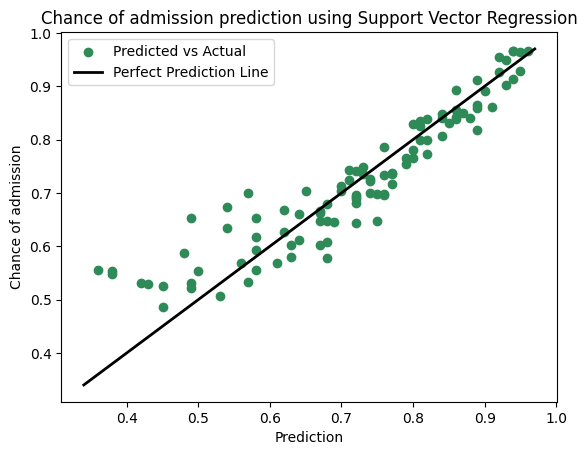

In [15]:
# Plotting the original data points
plt.scatter(y_test, y_pred_mlp, color='seagreen', label='Predicted vs Actual')

# Plotting the identity line, where predicted values equal actual values
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k-', lw=2, label='Perfect Prediction Line')  
plt.xlabel('Prediction')
plt.ylabel('Chance of admission')
plt.title('Chance of admission prediction using Support Vector Regression')
plt.legend()
plt.show()


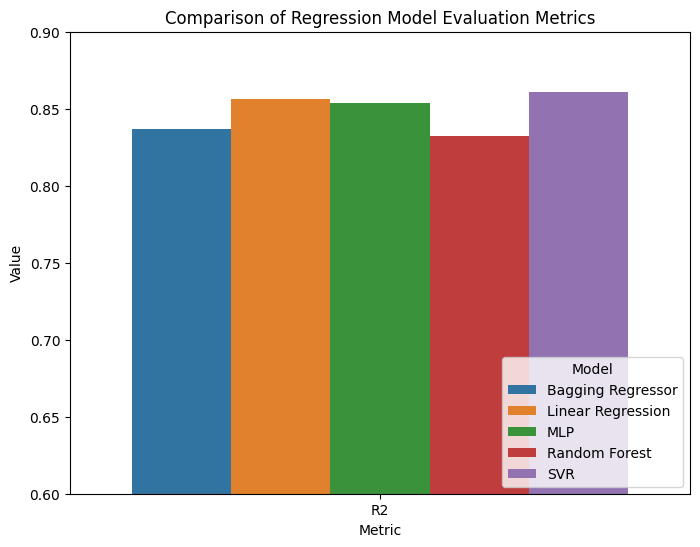

In [16]:
# Defining a dictionary with the model names and R^2 scores
metrics = {
    'Model': ['Bagging Regressor', 'Linear Regression', 'MLP', 'Random Forest', 'SVR'],
    'R2': [0.837, 0.856, 0.854, 0.832, 0.861]
}

# Converting the dictionary to a DataFrame
df2 = pd.DataFrame(metrics)

# Plotting the chart showing how the R^2 scores of the models compare to each each other
df_melted = df2.melt(id_vars='Model', var_name='Metric', value_name='Value')
plt.figure(figsize=(8, 6))
sns.barplot(data=df_melted, x='Metric', y='Value', hue='Model')
plt.title('Comparison of Regression Model Evaluation Metrics')
plt.xlabel('Metric')
plt.ylabel('Value')

# Adjusting the legend to be in the bottom right corner
plt.legend(title='Model', loc='lower right', bbox_to_anchor=(1.0, 0.0))

# Zooming in on the y-axis to show values between 0.6 and 0.9
plt.ylim(0.6, 0.9)
plt.show()



Applying the PDP model for global explanations

C:\Users\iulia\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
C:\Users\iulia\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
C:\Users\iulia\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
C:\Users\iulia\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warning

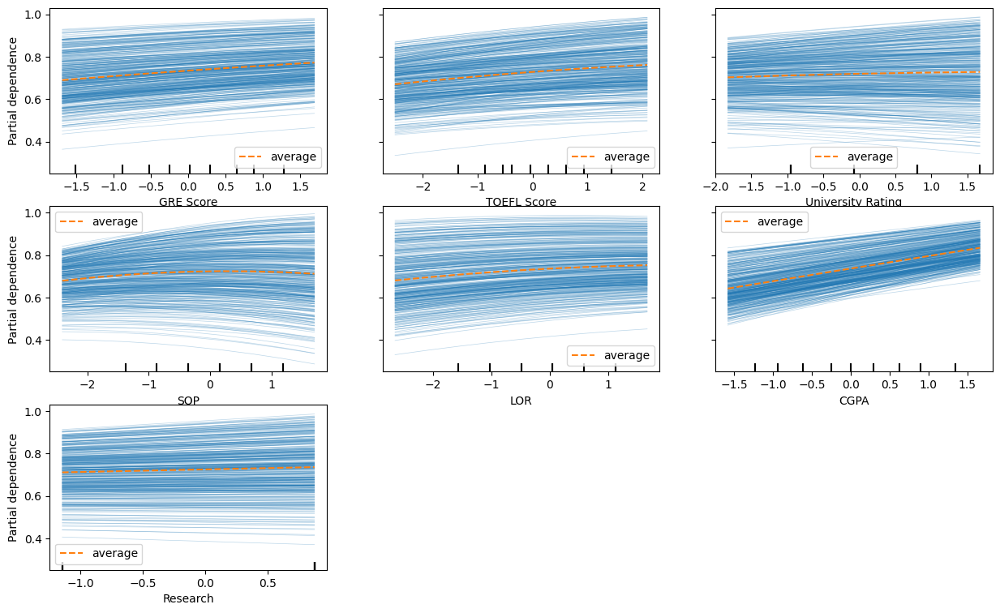

C:\Users\iulia\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
C:\Users\iulia\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
C:\Users\iulia\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
C:\Users\iulia\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warning

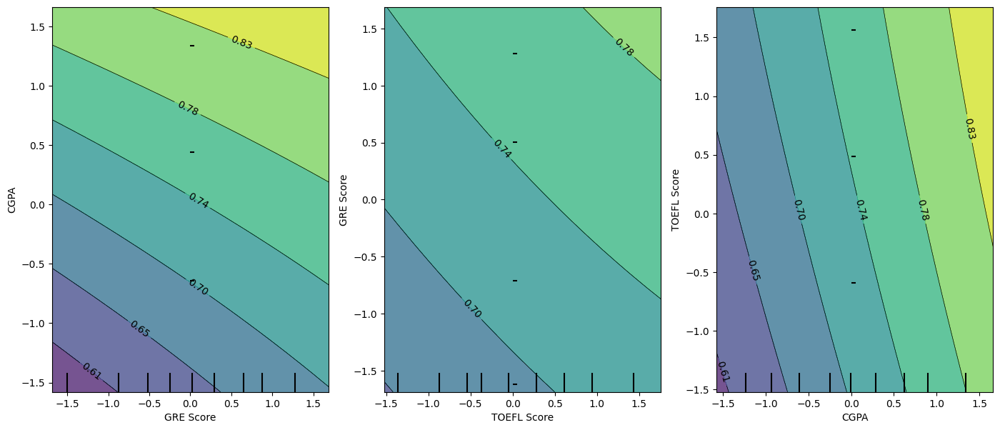

In [17]:
# Converting the scaled training set into a DataFrame
X_train_scaled_pd = pd.DataFrame(X_train_scaled, columns=X_train.columns)

# Selecting the individual features
features = ['GRE Score', 'TOEFL Score', 'University Rating', 'SOP', 'LOR', 'CGPA', 'Research'] 
# Selecting the pairs of feature for exploring their interaction in relation to the target variable
pairs = [('GRE Score', 'CGPA'), ('TOEFL Score', 'GRE Score'), ('CGPA', 'TOEFL Score')]  

# Displaying the plots for each feature
fig, ax = plt.subplots(figsize=(15, 9))
display = PartialDependenceDisplay.from_estimator(
    svm_best_model,
    X=X_train_scaled_pd,
    features=features,
    kind='both',  
    ax=ax,
    grid_resolution=40
)
plt.show()

# Displaying three plots for each interaction between features
fig, ax = plt.subplots(figsize=(17, 7))
display = PartialDependenceDisplay.from_estimator(
    svm_best_model,
    X=X_train_scaled_pd,
    features=pairs,
    kind='average', 
    ax=ax,
    grid_resolution=20
)
plt.show()


Applying PFI for global explanations

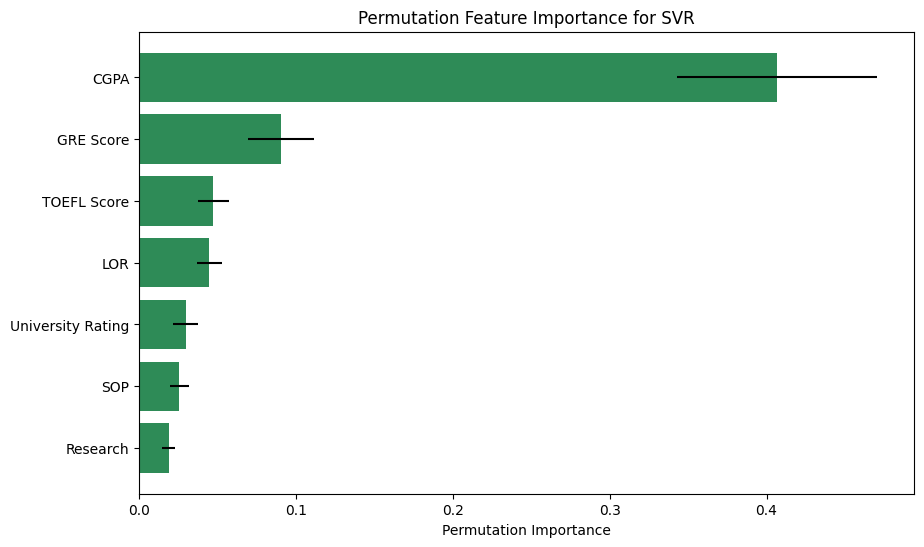

In [18]:
# Computing permutation feature importance function
perm_importance = permutation_importance(svm_best_model, X_test_scaled, y_test, n_repeats=10, random_state=42)

# Applying the function to the features
feature_names = X.columns
sorted_idx = perm_importance.importances_mean.argsort()

# Displaying the feature importances 
plt.figure(figsize=(10, 6))
plt.barh(feature_names[sorted_idx], perm_importance.importances_mean[sorted_idx], xerr=perm_importance.importances_std[sorted_idx], color='seagreen')
plt.xlabel('Permutation Importance')
plt.title('Permutation Feature Importance for SVR')
plt.show()

Performing a SHAP analysis for local and global explanations

C:\Users\iulia\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\iulia\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")
100%|██████████| 100/100 [00:00<00:00, 103.55it/s]


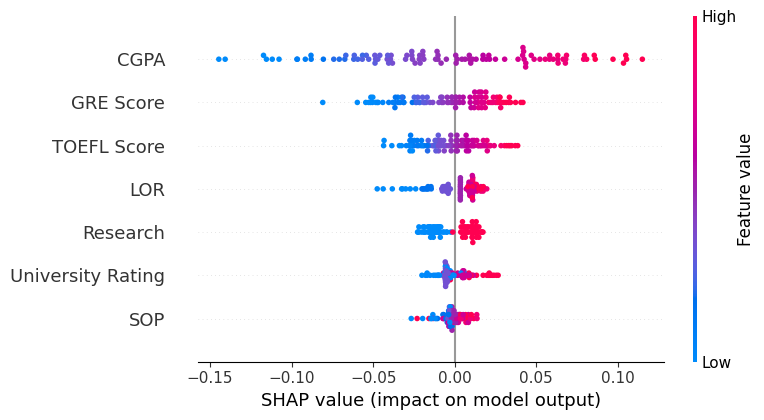

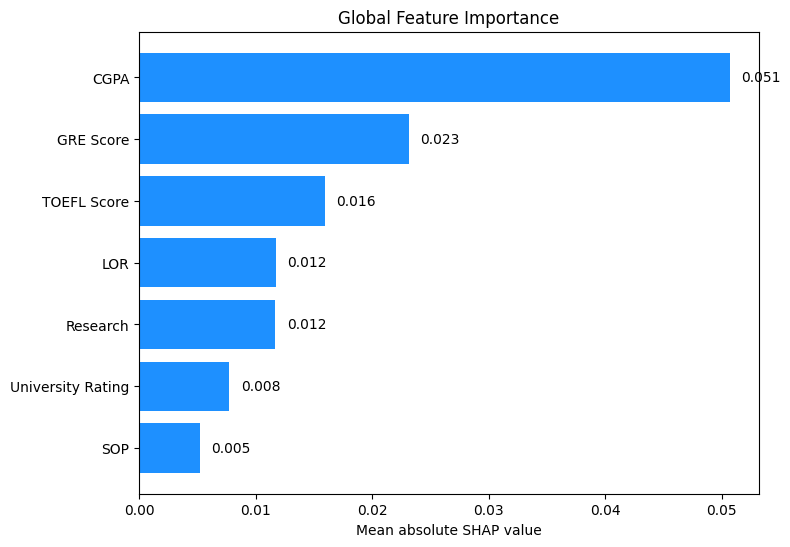

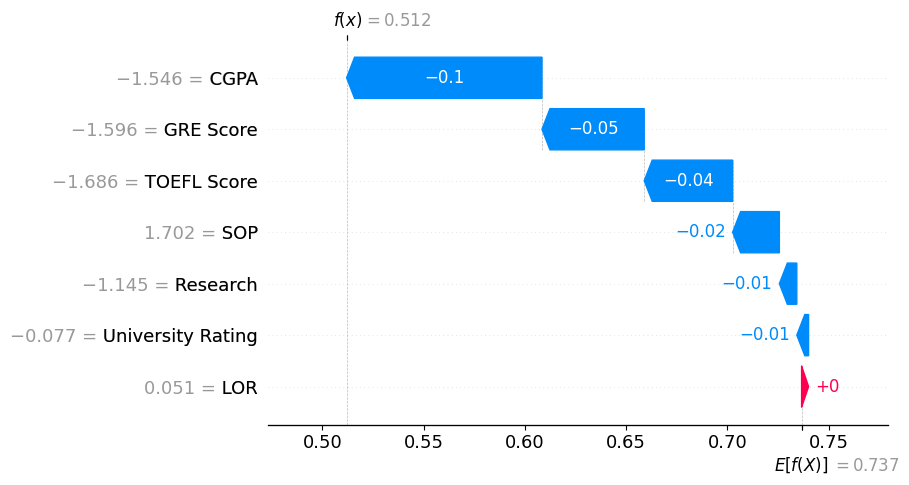

True Value for instance 8: 0.38
Predicted Value for instance 8: 0.5119874546577954


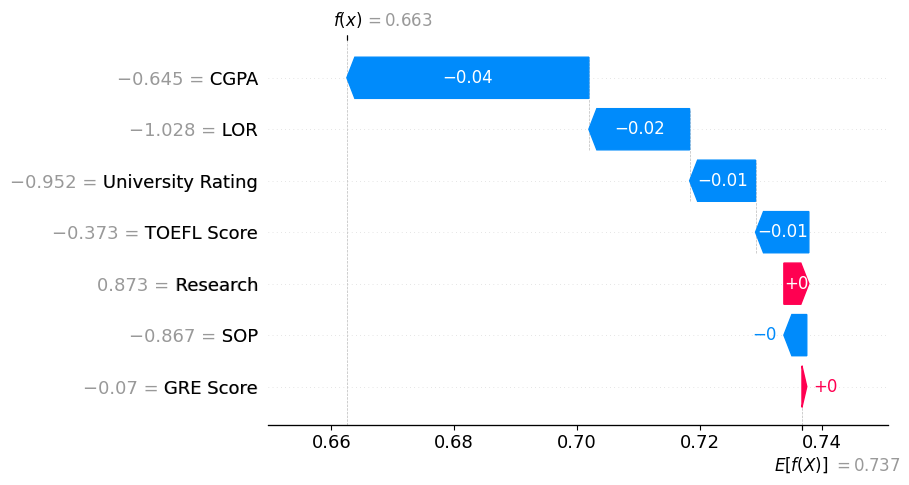

True Value for instance 14: 0.49
Predicted Value for instance 14: 0.6625262987600266


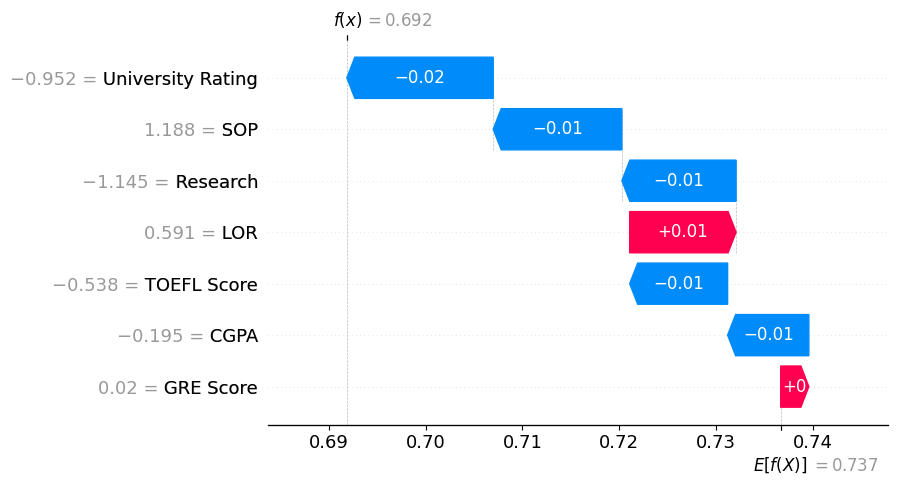

True Value for instance 37: 0.57
Predicted Value for instance 37: 0.6918617297435716


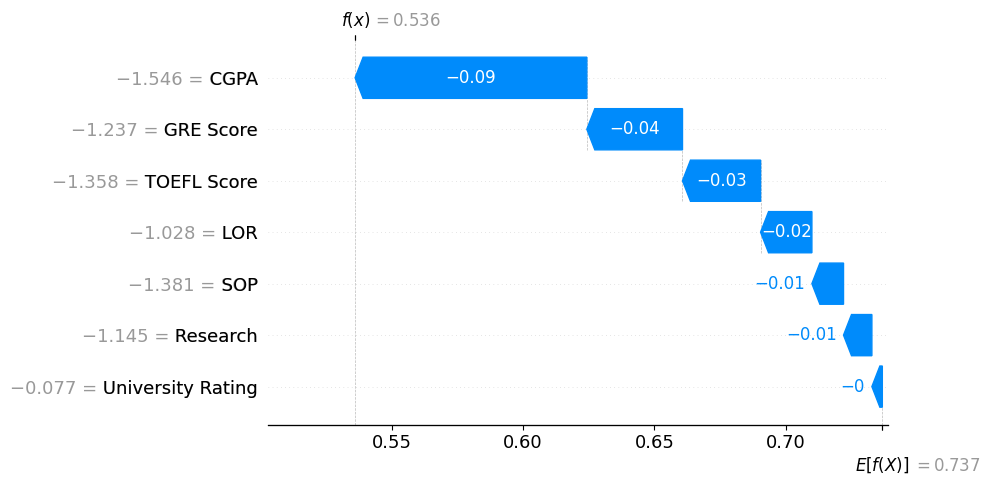

True Value for instance 47: 0.36
Predicted Value for instance 47: 0.5361393474731534


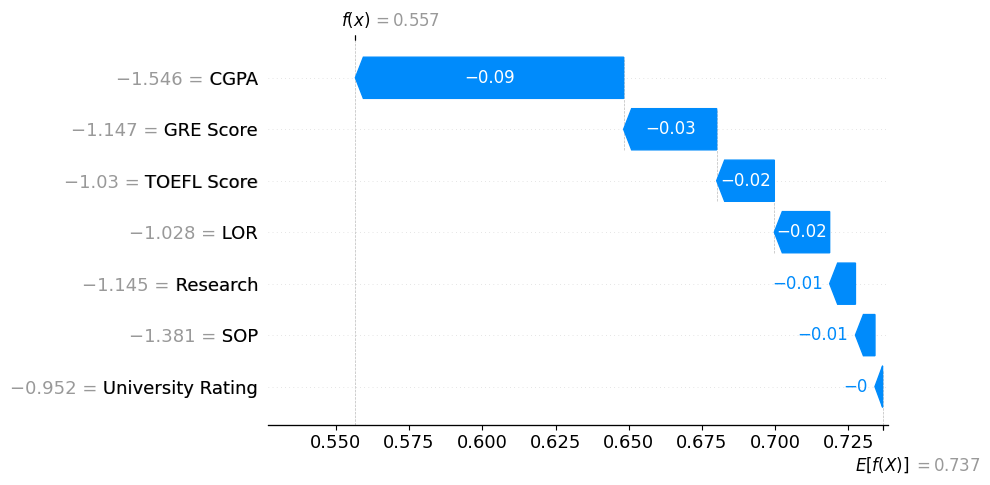

True Value for instance 51: 0.38
Predicted Value for instance 51: 0.5566562375915611


In [19]:
# Transforming the test set into a Pandas dataframe
X_test_scaled_p = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Creating a SHAP KernelExplainer using the best SVR model and the training data
explainer = shap.KernelExplainer(svm_best_model.predict, shap.kmeans(X_train_scaled, k=5))

# Calculating SHAP values for the test set
shap_values = explainer.shap_values(X_test_scaled)

# Plotting a graph showing the SHAP values for all features
shap.summary_plot(shap_values, X_test_scaled, feature_names=X.columns)

# Calculating the mean absolute SHAP values for each feature
mean_abs_shap_values = np.abs(shap_values).mean(axis=0)

# Sorting the features by their mean absolute SHAP values
sorted_indices = np.argsort(mean_abs_shap_values)
sorted_features = X_test_scaled_p.columns[sorted_indices]
sorted_mean_abs_shap_values = mean_abs_shap_values[sorted_indices]

# Creating a bar plot displaying the global explanations of the features using th emean absolute SHAP values
plt.figure(figsize=(8, 6))
y_pos = np.arange(len(sorted_features))
plt.barh(y_pos, sorted_mean_abs_shap_values, align='center', color='dodgerblue')
plt.yticks(y_pos, sorted_features)
plt.xlabel('Mean absolute SHAP value')
plt.title('Global Feature Importance')

# Adding the values to the bars of the plot
for i, v in enumerate(sorted_mean_abs_shap_values):
    plt.text(v + 0.001, i, f'{v:.3f}', color='black', va='center', ha='left')

plt.show()

# Calculating differences between predicted and actual values
differences = np.abs(svm_y_pred - y_test)

# Defining a threshold for significant difference
threshold = differences.mean() + 2 * differences.std()  # example threshold
significant_diff_indices = np.where(differences > threshold)[0]

for instance_index in significant_diff_indices:
    # Computing SHAP values for each instance
    shap_values_instance = explainer.shap_values(X_test_scaled[instance_index])

    # Converting the SHAP values into an Explanation object
    shap_explanation = shap.Explanation(values=shap_values_instance,
                                        base_values=explainer.expected_value,
                                        data=X_test_scaled[instance_index],
                                        feature_names=X.columns.tolist())

    # Plotting the waterfall chart for the chosen instances
    shap.waterfall_plot(shap_explanation, max_display=10)

    # Computing the model's predictions for the instances to explain
    predicted_values = svm_best_model.predict(X_test_scaled)

    # Choosing the instance to explain and computing SHAP values
    shap_values = explainer.shap_values(X_test_scaled_p.iloc[instance_index])

    # Printing the true value and the predicted value
    print(f"True Value for instance {instance_index}: {y_test.iloc[instance_index]}")
    print(f"Predicted Value for instance {instance_index}: {predicted_values[instance_index]}")


Applying the LIME model for local explanations

In [20]:
# Applying LIME to explain local instances
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=['GRE Score', 'TOEFL Score', 'University Rating', 'SOP', 'LOR', 'CGPA', 'Research'],
    mode='regression',
    training_labels=y_train
)

# Calculating differences between predicted and actual values
differences = np.abs(svm_y_pred - y_test)

# Defining a threshold for significant difference
threshold = differences.mean() + 2 * differences.std() 
significant_diff_indices = np.where(differences > threshold)[0]

# Iterating through all instances with a significant difference
for index in significant_diff_indices:
    # Selecting each instance
    instance = X_test_scaled[index]
    # Applying the explainer on every instance
    exp = explainer.explain_instance(instance, svm_best_model.predict, num_features=7)
    # Printing each true and predicted value
    print(f"Explaining instance {index} with actual value {y_test.iloc[index]} and predicted value {svm_y_pred[index]}")
    exp.show_in_notebook(show_table=True)



Explaining instance 8 with actual value 0.38 and predicted value 0.5119874546577954


Explaining instance 14 with actual value 0.49 and predicted value 0.6625262987600266


Explaining instance 37 with actual value 0.57 and predicted value 0.6918617297435716


Explaining instance 47 with actual value 0.36 and predicted value 0.5361393474731534


Explaining instance 51 with actual value 0.38 and predicted value 0.5566562375915611
